In [112]:
#data loading
import pandas as pd
filename="/content/Bank_Transaction_Fraud_Detection.csv"
a=pd.read_csv(str(filename),nrows=30000)

print(a)

                                Customer_ID        Customer_Name  Gender  Age  \
0      d5f6ec07-d69e-4f47-b9b4-7c58ff17c19e           Osha Tella    Male   60   
1      7c14ad51-781a-4db9-b7bd-67439c175262      Hredhaan Khosla  Female   51   
2      3a73a0e5-d4da-45aa-85f3-528413900a35       Ekani Nazareth    Male   20   
3      7902f4ef-9050-4a79-857d-9c2ea3181940  Yamini Ramachandran  Female   57   
4      3a4bba70-d9a9-4c5f-8b92-1735fd8c19e9         Kritika Rege  Female   43   
...                                     ...                  ...     ...  ...   
29995  ee1e0b2b-e38c-4e5a-983d-96e83eb2c6e8         Forum Shenoy    Male   67   
29996  5edad835-5989-408c-9acb-0ca7b9012009          Krish Datta    Male   53   
29997  0c78019b-4f96-4875-9fbc-b21d1dbe7279        Bimala Wadhwa    Male   40   
29998  b5abc20f-c0a8-499b-bc2a-9370a88fa429       Jeevika Grover    Male   54   
29999  36557377-2d73-49d6-95a7-940e004e5857        Rehaan Gandhi    Male   25   

                           

In [113]:
##Checking for null values
a.isna().sum()

,0
Customer_ID,0
Customer_Name,0
Gender,0
Age,0
State,0
City,0
Bank_Branch,0
Account_Type,0
Transaction_ID,0
Transaction_Date,0


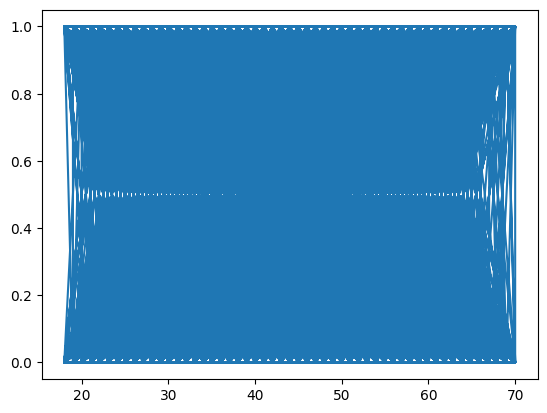

In [114]:
#Plotting using pyplot
from matplotlib import pyplot as plt
target="Is_Fraud"
index=3
plt.plot(a[a.columns[index]],a[str(target)])

<BarContainer object of 30000 artists>

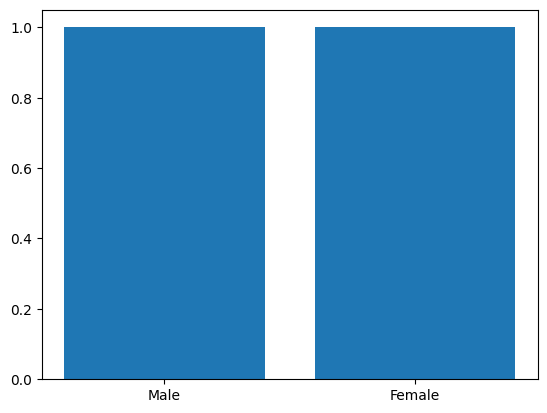

In [115]:
#Bar plot
plt.bar(a[a.columns[2]],a[str(target)])

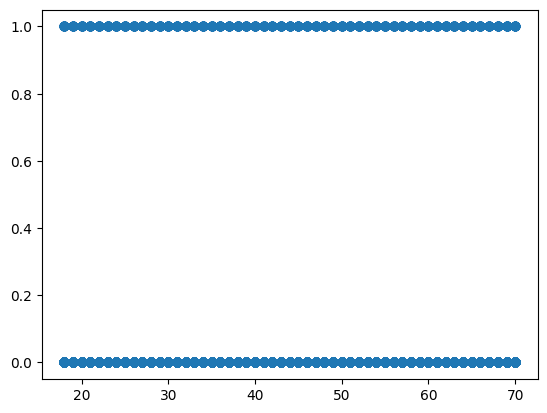

In [116]:
#Scatter plot
plt.scatter(a[a.columns[3]], a[str(target)])

In [118]:
#Convert String value to integer for Quality column
from sklearn.preprocessing import LabelEncoder
b = LabelEncoder()
transform_columns={0,1,2,4,5,6,7,8,9,11,13,14,16}
for i in transform_columns:
  a[a.columns[i]]=b.fit_transform(a[a.columns[i]])


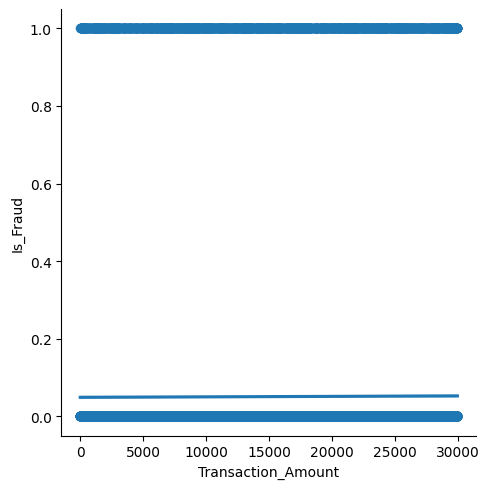

In [119]:
#Seaborn lmplot
import seaborn as sns
#a["family"] = pd.to_numeric(a["family"])
#a["parttime"] = pd.to_numeric(a["parttime"])
sns.lmplot(x="Transaction_Amount",y=str(target),data=a)

<Axes: xlabel='City', ylabel='Is_Fraud'>

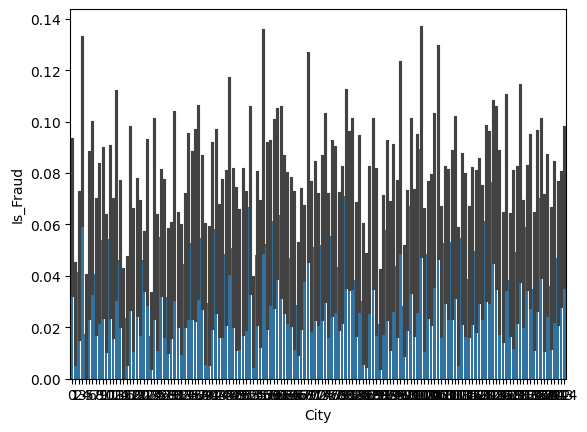

In [120]:
#SNS bar plot City vs Is_fraud
sns.barplot(x=a.columns[5],y=str(target),data=a)

<Axes: xlabel='Gender', ylabel='Is_Fraud'>

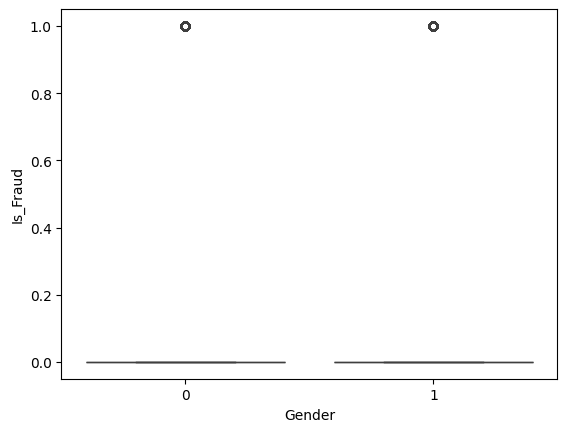

In [121]:
#Box plot for Gender versus Is_Fraud
sns.boxplot(x=a.columns[2],y=str(target),data=a)

<ipython-input-122-a2514fe9ac8b>:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(a[str(target)])


<Axes: xlabel='Is_Fraud', ylabel='Density'>

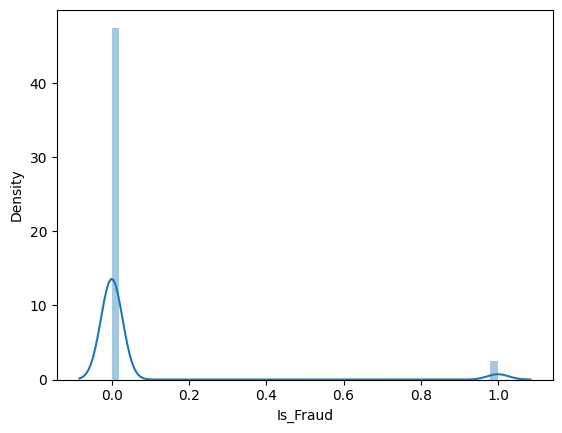

In [122]:
#Dist plot for Is_Fraud
sns.distplot(a[str(target)])

<Axes: xlabel='Customer_Name', ylabel='Density'>

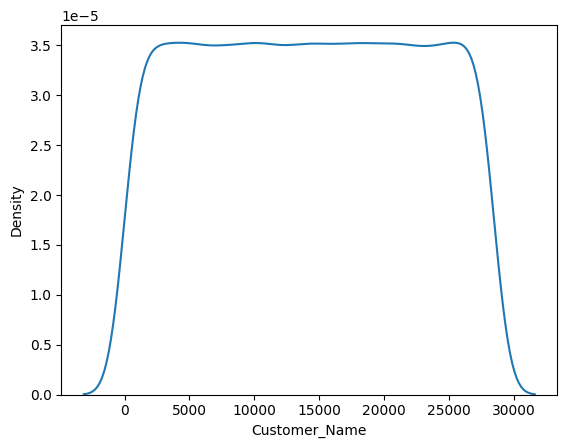

In [123]:
#Kde plot for Customer Name
sns.kdeplot(a[a.columns[1]])

<Axes: xlabel='State', ylabel='count'>

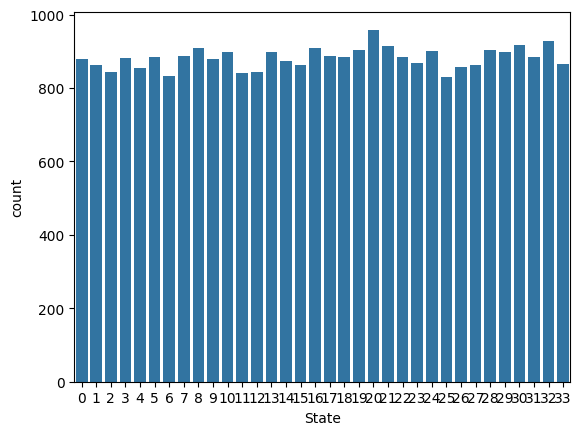

In [124]:
#Count plot for State
sns.countplot(x=a.columns[4],data=a)

<Axes: >

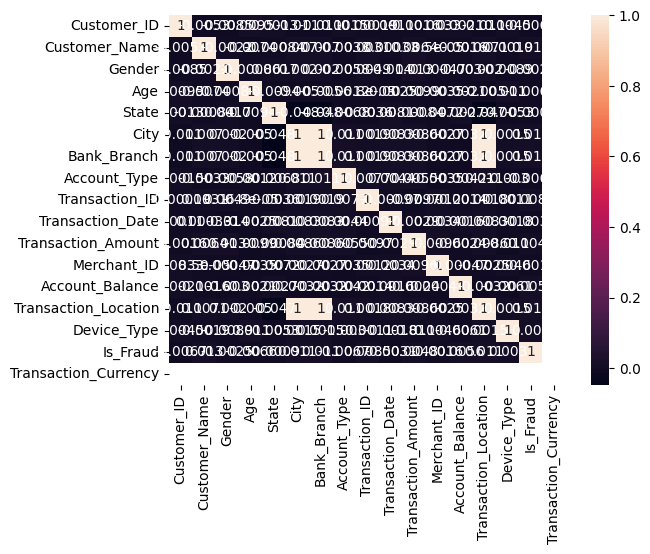

In [125]:
#Heatmap of data
import numpy as np
data=a.select_dtypes(include=np.number).corr()
#data=a.corr()

sns.heatmap(data, annot=True)

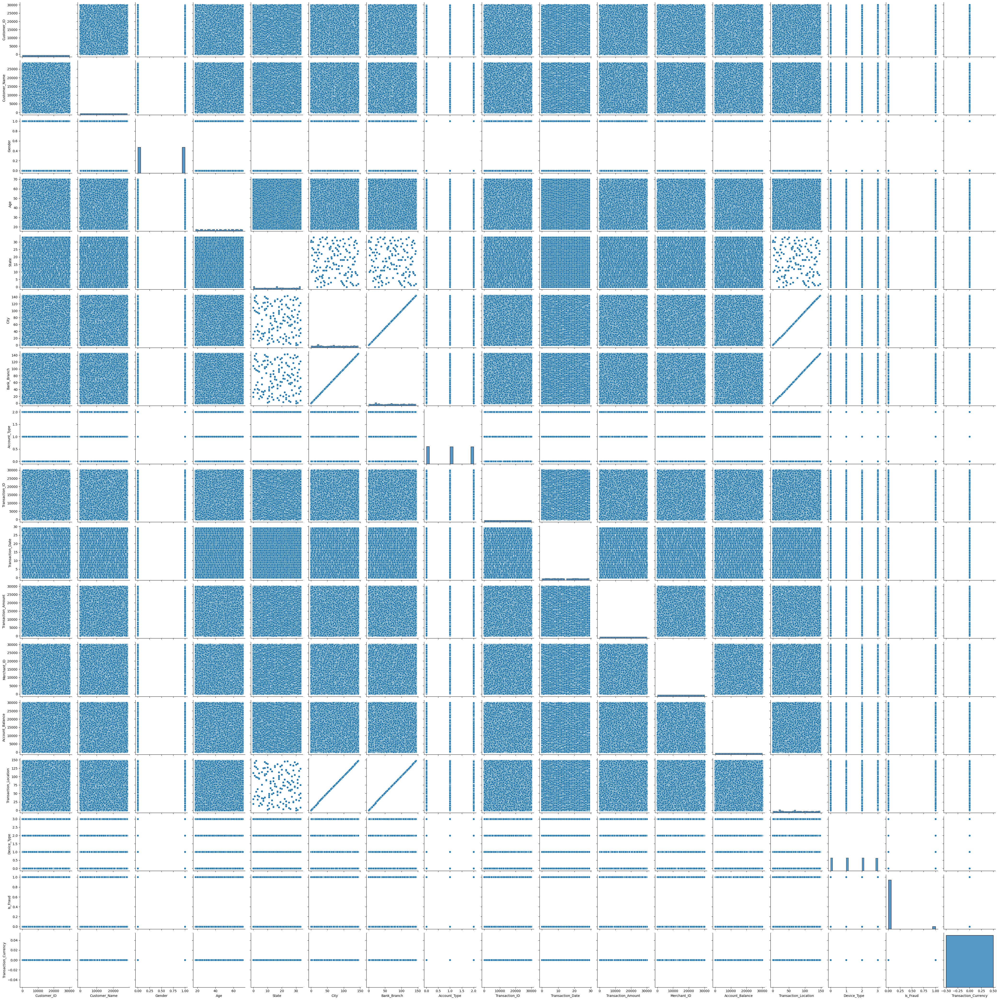

In [126]:
#SNS pairplot
sns.pairplot(data=a)

In [127]:
#data split

y=a[str(target)]
x=a.iloc[:,a.columns != str(target)]


print(x)

       Customer_ID  Customer_Name  Gender  Age  State  City  Bank_Branch  \
0            25053          18783       1   60     15   127          127   
1            14527          11008       0   51     18   100          100   
2             6781           7357       1   20      4    13           13   
3            14172          27063       0   57     28    22           22   
4             6760          14404       0   43     25     7            7   
...            ...            ...     ...  ...    ...   ...          ...   
29995        27889           8796       1   67      6    34           34   
29996        11024          14164       1   53      7    33           33   
29997         1442           4250       1   40     26    56           56   
29998        21273          13148       1   54      2    97           97   
29999         6263          20703       1   25      9   106          106   

       Account_Type  Transaction_ID  Transaction_Date  Transaction_Amount  \
0         

In [128]:
print(y)

0        0
1        0
2        0
3        0
4        0
        ..
29995    0
29996    0
29997    0
29998    1
29999    0
Name: Is_Fraud, Length: 30000, dtype: int64


In [129]:
#train test split
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2)

In [130]:
print(x_train)

       Customer_ID  Customer_Name  Gender  Age  State  City  Bank_Branch  \
7296         21355          23283       0   57     33   122          122   
12251        22314          15712       1   18     23    16           16   
26159         1402          10869       1   21     10    14           14   
2242          5624          14932       0   63     21    72           72   
1170         22907           9316       0   49      5    21           21   
...            ...            ...     ...  ...    ...   ...          ...   
26003          872           5141       1   69     21    72           72   
6930         16331          15686       1   18     22    71           71   
26937         3755          11251       1   47     33     8            8   
1858         27430          24693       0   26      2   126          126   
24324        12028          24471       0   19     13    58           58   

       Account_Type  Transaction_ID  Transaction_Date  Transaction_Amount  \
7296      

In [131]:
print(y_train)

7296     0
12251    0
26159    0
2242     0
1170     0
        ..
26003    0
6930     0
26937    0
1858     1
24324    0
Name: Is_Fraud, Length: 24000, dtype: int64


In [132]:
print(x_test)

       Customer_ID  Customer_Name  Gender  Age  State  City  Bank_Branch  \
10967         1723           4733       1   32     33    48           48   
18646         7092          14311       0   38     33     8            8   
884          18062          15931       0   31     17   134          134   
25048        14436           4550       1   39     32   115          115   
22676        16455           7112       1   61     13    46           46   
...            ...            ...     ...  ...    ...   ...          ...   
17052          600          10348       1   28     16    68           68   
19975        29993          20709       0   64      1   129          129   
19390        27724           1528       0   67     23    25           25   
4233         18803          10499       1   43     25    80           80   
19905        18573          18348       1   34     21    20           20   

       Account_Type  Transaction_ID  Transaction_Date  Transaction_Amount  \
10967     

In [133]:
print(y_test)

10967    0
18646    0
884      0
25048    0
22676    0
        ..
17052    0
19975    0
19390    0
4233     0
19905    0
Name: Is_Fraud, Length: 6000, dtype: int64


In [134]:
from sklearn.linear_model import LogisticRegression

model=LogisticRegression()
model.fit(x_train,y_train)
ypred=model.predict(x_test)

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [135]:
print(ypred)

[0 0 0 ... 0 0 0]


In [136]:
#Print accuracy score
from sklearn.metrics import accuracy_score
#y_test=y_test.astype('int')
print(accuracy_score(y_test,ypred))

0.9496666666666667


In [137]:
#Print confusion matrix
from sklearn.metrics import confusion_matrix
print(confusion_matrix(y_test,ypred))

[[5698    0]
 [ 302    0]]


In [139]:
print(model.predict([[1723,4733,1,32,33,48,48,0,13380,18,29082,14163,3781,50,2,0]]))

[0]


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


In [140]:
from sklearn.tree import DecisionTreeClassifier
b=DecisionTreeClassifier()
b.fit(x_train,y_train)
ypred=b.predict(x_test)

In [141]:
print(ypred)

[0 0 0 ... 0 0 0]


In [142]:
#Print accuracy score
from sklearn.metrics import accuracy_score
print(accuracy_score(y_test,ypred))

0.8926666666666667


In [143]:
#Print confusion matrix
from sklearn.metrics import confusion_matrix
print(confusion_matrix(y_test,ypred))

[[5342  356]
 [ 288   14]]


In [144]:
from sklearn.metrics import classification_report
print(classification_report(y_test,ypred))

              precision    recall  f1-score   support

           0       0.95      0.94      0.94      5698
           1       0.04      0.05      0.04       302

    accuracy                           0.89      6000
   macro avg       0.49      0.49      0.49      6000
weighted avg       0.90      0.89      0.90      6000



In [145]:
print(model.predict([[1723,4733,1,32,33,48,48,0,13380,18,29082,14163,3781,50,2,0]]))

[0]


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


In [146]:
from sklearn.ensemble import RandomForestClassifier
b=RandomForestClassifier()
b.fit(x_train,y_train)
ypred=b.predict(x_test)

In [147]:
print(ypred)

[0 0 0 ... 0 0 0]


In [148]:
#Print accuracy score
from sklearn.metrics import accuracy_score
print(accuracy_score(y_test,ypred))

0.9496666666666667


In [149]:
#Print confusion matrix
from sklearn.metrics import confusion_matrix
print(confusion_matrix(y_test,ypred))

[[5698    0]
 [ 302    0]]


In [150]:
print(model.predict([[1723,4733,1,32,33,48,48,0,13380,18,29082,14163,3781,50,2,0]]))

[0]


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


In [151]:
from sklearn.metrics import classification_report
print(classification_report(y_test,ypred))

              precision    recall  f1-score   support

           0       0.95      1.00      0.97      5698
           1       0.00      0.00      0.00       302

    accuracy                           0.95      6000
   macro avg       0.47      0.50      0.49      6000
weighted avg       0.90      0.95      0.93      6000



/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
